In [1]:
import torch
import pickle
import matplotlib.pyplot as plt
from torch.fft import ifftn, fftn, fftshift
from torchvision.utils import make_grid
from torch import nn

with open(
        #'/itet-stor/peerli/net_scratch/sample_varianceCPU.obj',
        "/Users/lionelpeer/Downloads/sample_varianceCPU.obj",
        'rb'
    ) as f:
    outs = pickle.load(f)

# Looking at some Examples

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'starting from t 200')

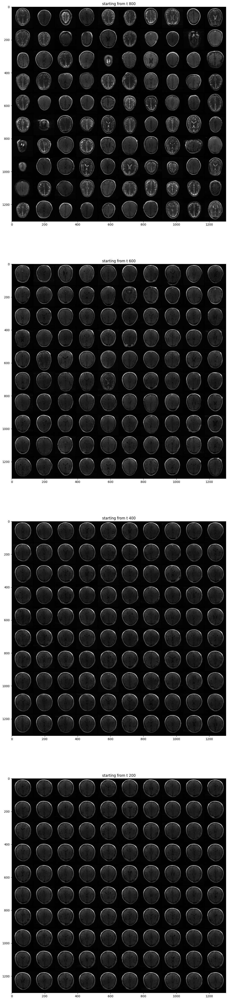

In [26]:
t = [800, 600, 400, 200]
fig, ax = plt.subplots(4,1,figsize=(15,60))

ax[0].imshow(make_grid(outs[t[0]], nrow=10).permute(1,2,0))
ax[0].set_title(f"starting from t {t[0]}")

ax[1].imshow(make_grid(outs[t[1]], nrow=10).permute(1,2,0))
ax[1].set_title(f"starting from t {t[1]}")

ax[2].imshow(make_grid(outs[t[2]], nrow=10).permute(1,2,0))
ax[2].set_title(f"starting from t {t[2]}")

ax[3].imshow(make_grid(outs[t[3]], nrow=10).permute(1,2,0))
ax[3].set_title(f"starting from t {t[3]}")

# Image Means and Variances

Text(0.5, 1.0, 'Image variances (startgin between t=10 and t=990)')

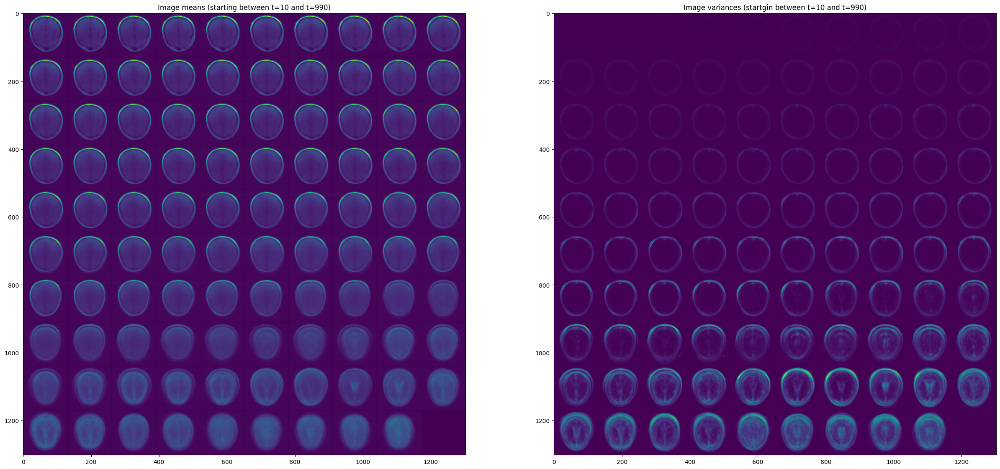

In [41]:
vars = torch.zeros((99,1,128,128))
means = torch.zeros((99,1,128,128))
for key, val in outs.items():
    means[key//10-1] = torch.mean(val, dim=0)
    vars[key//10-1] = torch.var(val, dim=0)

fig, ax = plt.subplots(1,2, figsize=(30,15))
ax[0].imshow(make_grid(means, nrow=10)[0], cmap="viridis")
ax[0].set_title("Image means (starting between t=10 and t=990)")
ax[1].imshow(make_grid(vars, nrow=10)[0], cmap="viridis")
ax[1].set_title("Image variances (startgin between t=10 and t=990)")

# Spectra Means and Variances

Text(0.5, 1.0, 'Spectra log variances (starting between t=10 and t=990)')

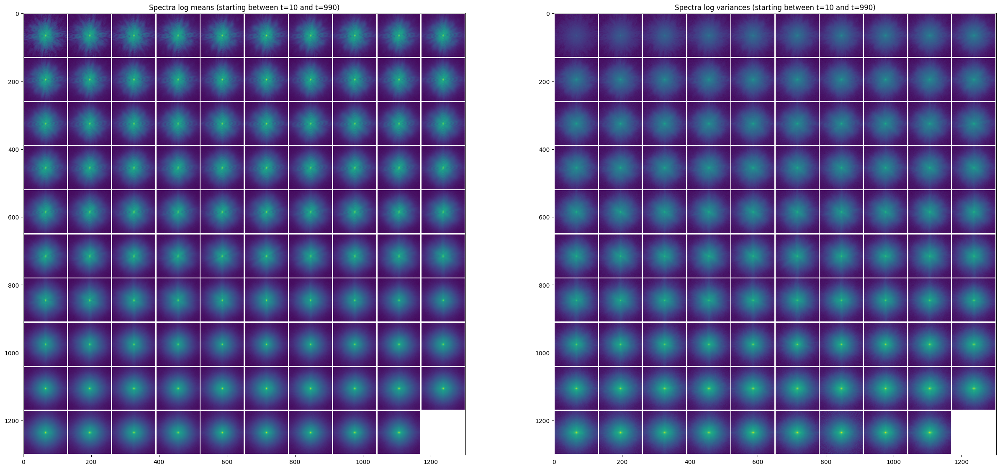

In [57]:
vars = torch.zeros((99,1,128,128))
means = torch.zeros((99,1,128,128))
for key, val in outs.items():
    val = torch.abs(fftshift(fftn(val, dim=(2,3)), dim=(2,3)))
    means[key//10-1] = torch.mean(val, dim=0)
    vars[key//10-1] = torch.var(val, dim=0)

fig, ax = plt.subplots(1,2, figsize=(30,15))
ax[0].imshow(torch.log(make_grid(means, nrow=10)[0]), cmap="viridis")
ax[0].set_title("Spectra log means (starting between t=10 and t=990)")
ax[1].imshow(torch.log(make_grid(vars, nrow=10)[0]), cmap="viridis")
ax[1].set_title("Spectra log variances (starting between t=10 and t=990)")

Text(0.5, 1.0, 'Cumulative spectra variances for t in [10,990]')

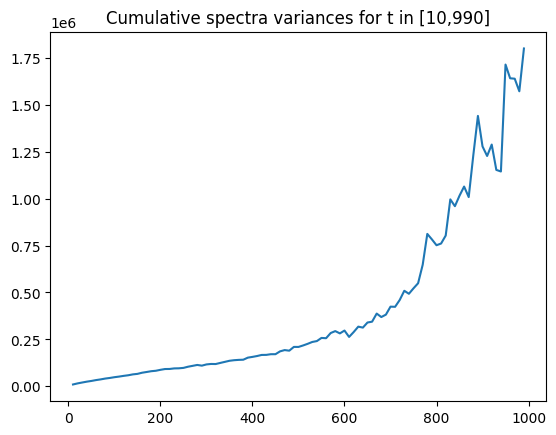

In [60]:
fig, ax = plt.subplots()
sums = torch.sum(vars, dim=(1,2,3))
x = torch.linspace(10, 990, vars.shape[0])
ax.plot(x, sums)
ax.set_title("Cumulative spectra variances for t in [10,990]")

Text(0.5, 1.0, 'Spectra log variances differences between current timestep and previous timestep (starting between t=10 and t=990)')

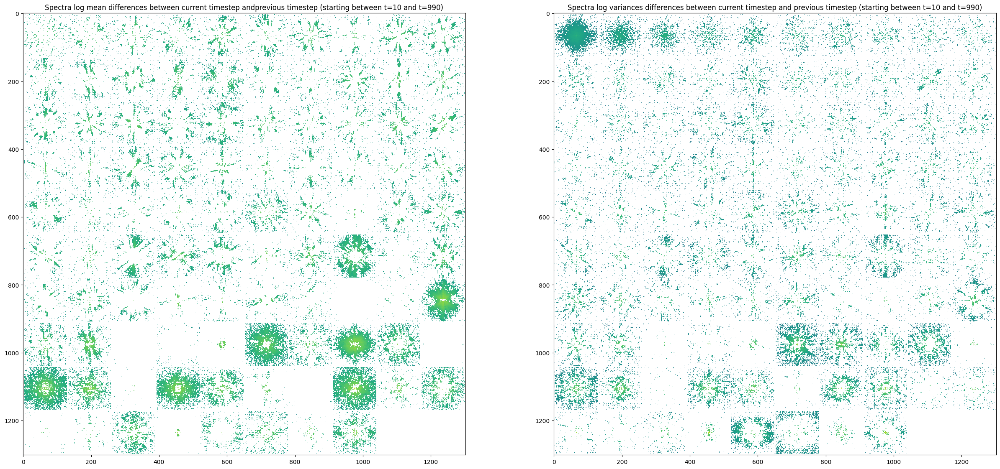

In [15]:
var_diffs = torch.zeros((99,1,128,128))
mean_diffs = torch.zeros((99,1,128,128))
mean0 = torch.zeros((1,128,128))
var0 = torch.zeros((1,128,128))

for (key0, val0), (key1, val1) in zip(list(outs.items())[:-1], list(outs.items())[1:]):
    val0 = torch.abs(fftshift(fftn(val0, dim=(2,3)), dim=(2,3)))
    val1 = torch.abs(fftshift(fftn(val1, dim=(2,3)), dim=(2,3)))

    mean0 = torch.mean(val0, dim=0)# + mean0
    mean1 = torch.mean(val1, dim=0)
    var0 = torch.var(val0, dim=0)# + var0
    var1 = torch.var(val1, dim=0)

    mean = mean0 - mean1
    var = var0 - var1

    mean_diffs[key1//10-1] = mean
    var_diffs[key1//10-1] = var

fig, ax = plt.subplots(1,2, figsize=(30,15))
ax[0].imshow(torch.log(make_grid(mean_diffs, nrow=10))[0], cmap="viridis")
ax[0].set_title("Spectra log mean differences between current timestep andprevious timestep (starting between t=10 and t=990)")
ax[1].imshow(torch.log(make_grid(var_diffs, nrow=10))[0], cmap="viridis")
ax[1].set_title("Spectra log variances differences between current timestep and previous timestep (starting between t=10 and t=990)")

Text(0.5, 0.9, 'Plots of Central Horizontal Slices through Spectral Variance (normalized to range [0,200000]; no log)')

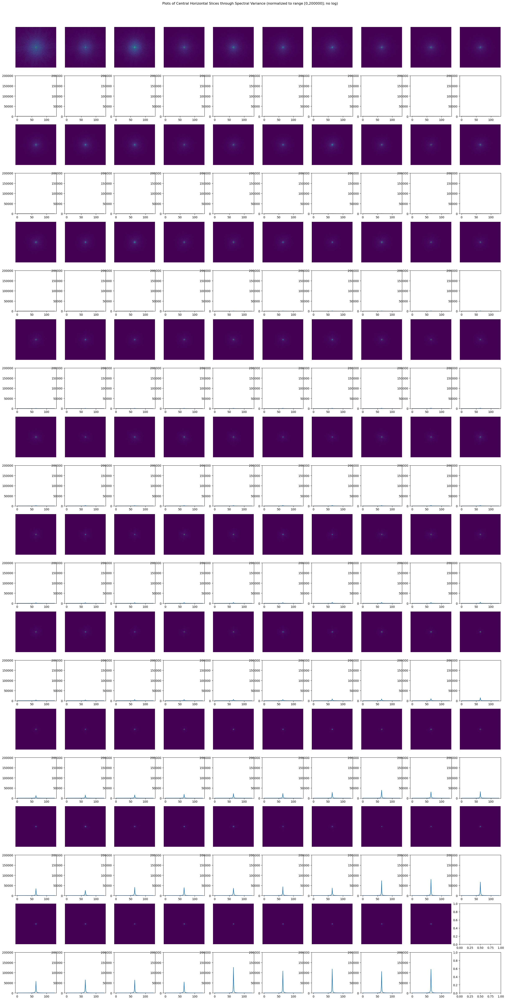

In [3]:
vars = torch.zeros((99,1,128,128))
means = torch.zeros((99,1,128,128))
for key, val in outs.items():
    val = torch.abs(fftshift(fftn(val, dim=(2,3)), dim=(2,3)))
    means[key//10-1] = torch.mean(val, dim=0)
    vars[key//10-1] = torch.var(val, dim=0)

middle_slices = []

fig, ax = plt.subplots(20,10, figsize=(30,60))
for i, t in enumerate(vars):
    ax[i//10*2,i%10].imshow(t[0])
    ax[i//10*2,i%10].axis("off")
    middle_slice = torch.mean(t[0][62:66], dim=0)
    ax[i//10*2+1,i%10].plot(middle_slice)
    ax[i//10*2+1,i%10].set_ylim([0,200000])
    middle_slices.append(middle_slice)

fig.suptitle("Plots of Central Horizontal Slices through Spectral Variance (normalized to range [0,200000]; no log)", y=0.90)

In [7]:
middle_slices[0].max()

tensor(4.3829)

Text(0.5, 1.0, 'Max Values in Horizontal Slices')

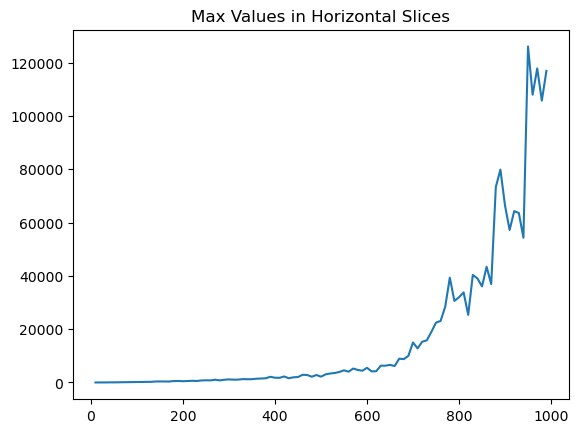

In [9]:
maxes = [elem.max() for elem in middle_slices]
fig, ax = plt.subplots()
x = torch.linspace(10,990,99)
ax.plot(x, maxes)
ax.set_title("Max Values in Horizontal Slices")

In [72]:
class ParzenWindow:
    def __init__(self, L: float=32, size: int=128) -> None:
        self.L = torch.tensor(L, dtype=torch.long)
        self.n = torch.arange(-L//2, L//2)
        middle = L//2
        self.n_inner = self.n[middle-L//4:middle+L//4]
        self.n_outer_left = self.n[:middle-L//4]
        self.n_outer_right = self.n[middle+L//4:]
        self.n_zeros_left = None
        self.n_zeros_right = None
        if size > L:
            self.n_zeros_left = torch.zeros((size-L)//2)
            self.n_zeros_right = torch.zeros((size-L)//2)
 
    def __call__(self):
        w_0_inner = 1 - 6*(self.n_inner / (self.L/2))**2*(1 - torch.abs(self.n_inner)/(self.L/2))
        w_0_outer_left = 2 * (1 - torch.abs(self.n_outer_left/(self.L-1)/2))**3
        w_0_outer_right = 2 * (1 - torch.abs(self.n_outer_right/(self.L-1)/2))**3
        if self.n_zeros_left is not None:
            return torch.cat([self.n_zeros_left, w_0_outer_left, w_0_inner, w_0_outer_right, self.n_zeros_right])
        return torch.cat([w_0_outer_left, w_0_inner, w_0_outer_right])
    
    def get_kspace(self):
        w_0 = self()
        return torch.abs(fftshift(fftn(w_0, dim=0), dim=0))

    def plot(self):
        plt.plot(self.w_0.detach().numpy())

    def plot_kspace(self):
        plt.plot(torch.abs(fftshift(fftn(self.w_0, dim=0), dim=0)).detach().numpy())

In [96]:
maxes = []
kspaces = []
spaces = []
for L in torch.linspace(0,120000,1000):
    win = ParzenWindow(int(L))
    space = win()
    spaces.append(space)
    kspace = win.get_kspace()
    kspaces.append(kspace)
    maxes.append(kspace.max())

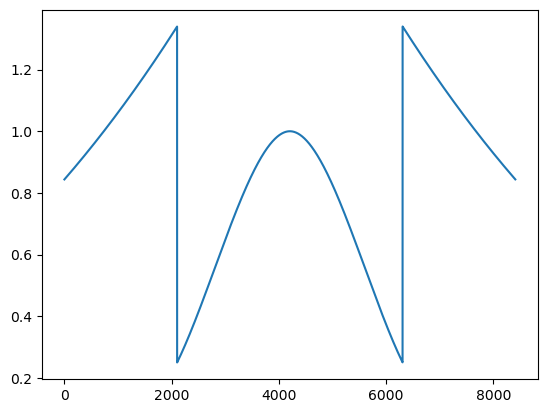

In [107]:
plt.plot(spaces[70])